<a href="https://colab.research.google.com/github/nagarjunakki02/Image-analysis-on-mast-cells/blob/main/Image_analysis_on_mast_cells.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Installing and Importing necessary libraries

In [ ]:
pip install opencv-python

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [ ]:
img = cv.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg',0)
print(img.shape)

(1920, 2560)


# Converting Image to Histogram

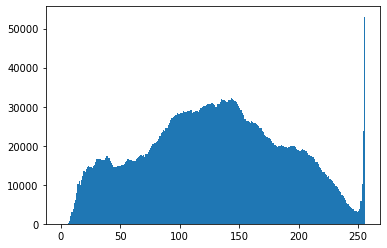

In [ ]:
plt.hist(img.ravel(),256,[0,256]); plt.show()

# Intensity of Image distributed into R G B channels

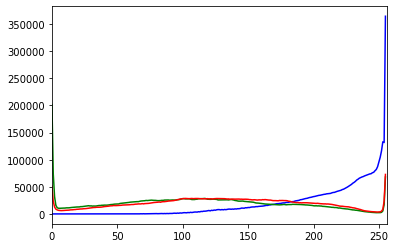

In [ ]:
img = cv.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg')
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

In [ ]:
from skimage import io
import matplotlib.pyplot as plt

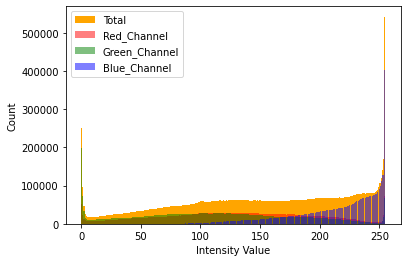

In [ ]:
image = io.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg')
plt.hist(image.ravel(), bins = 256, color = 'orange', )
plt.hist(image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
plt.hist(image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
plt.hist(image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

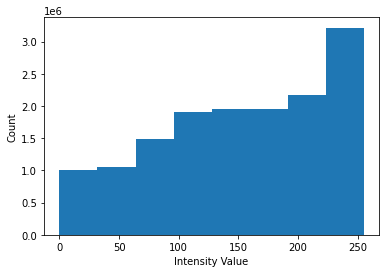

In [ ]:
plt.hist(image.ravel(), bins = 8 )
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.show()

(array([11.,  3.,  9., 12., 11.,  6., 11., 12., 10., 15.]),
 array([0.00339145, 0.10300303, 0.20261461, 0.30222619, 0.40183777,
        0.50144934, 0.60106092, 0.7006725 , 0.80028408, 0.89989566,
        0.99950724]),
 <a list of 10 Patch objects>)

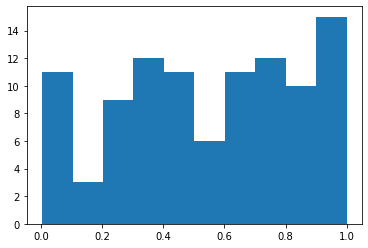

In [ ]:
x = np.random.rand(100)
plt.hist(x)

# Harris Corner Detection

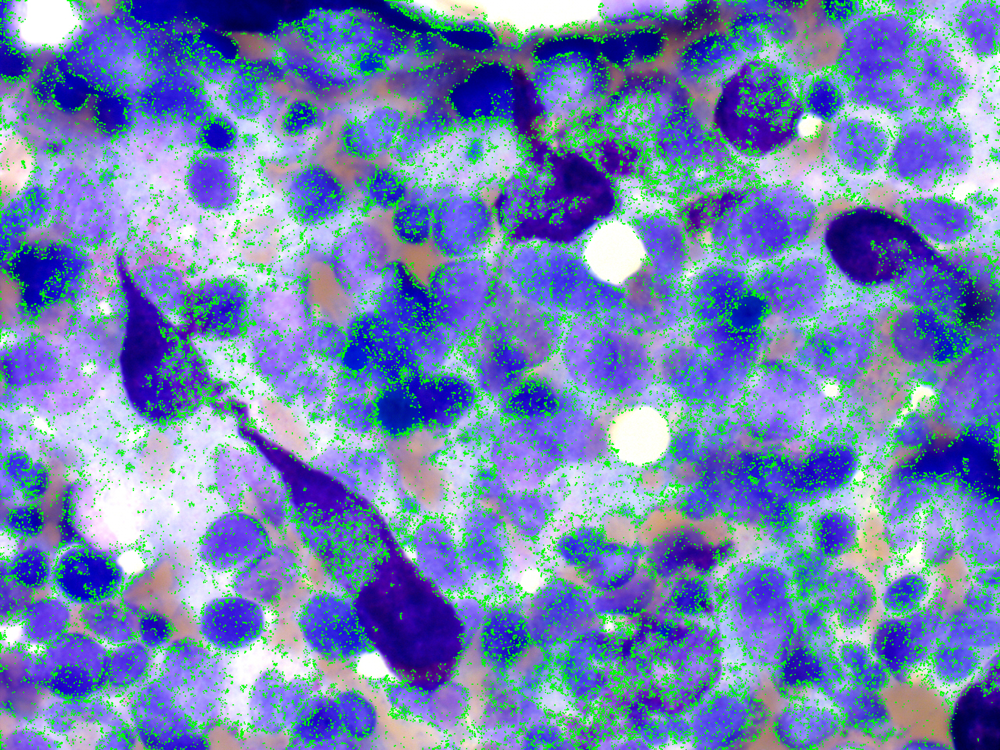

-1

In [ ]:
img = cv.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg')
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_img = np.float32(gray_img)
from google.colab.patches import cv2_imshow 

dst = cv.cornerHarris(gray_img, blockSize=2, ksize=3, k=0.04)

# dilate to mark the corners
dst = cv.dilate(dst, None)
img[dst > 0.01 * dst.max()] = [0, 255, 0]

cv2_imshow(img)
cv.waitKey()

# Adaptive Mean Thresholding and Adaptive Gaussian Thresholding method to determine Mastocytosis

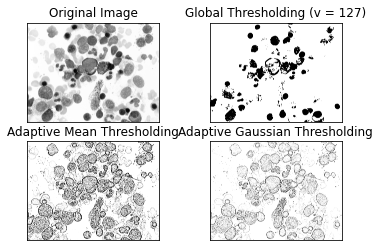

In [ ]:
img = cv.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-161029-0017.jpg',0)
img = cv.medianBlur(img,5)
ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

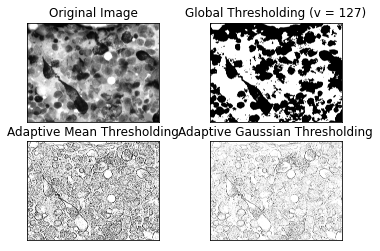

In [ ]:
img = cv.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg',0)
img = cv.medianBlur(img,5)
ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
import numpy as np 
import cv2 
import matplotlib.pyplot as plt 
from google.colab.patches import cv2_imshow 

# read original image 
image = cv2.imread("/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg") 

# convet to gray scale image 
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 
cv2.imwrite('gray.png', gray) 

# apply median filter for smoothning 
blurM = cv2.medianBlur(gray, 5) 
cv2.imwrite('blurM.png', blurM) 

# apply gaussian filter for smoothning 
blurG = cv2.GaussianBlur(gray, (9, 9), 0) 
cv2.imwrite('blurG.png', blurG) 

# histogram equalization 
histoNorm = cv2.equalizeHist(gray) 
cv2.imwrite('histoNorm.png', histoNorm) 

# create a CLAHE object for 
# Contrast Limited Adaptive Histogram Equalization (CLAHE) 
clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize=(8, 8)) 
claheNorm = clahe.apply(gray) 
cv2.imwrite('claheNorm.png', claheNorm) 


# contrast stretching 
# Function to map each intensity level to output intensity level. 
def pixelVal(pix, r1, s1, r2, s2): 
	if (0 <= pix and pix <= r1): 
		return (s1 / r1) * pix 
	elif (r1 < pix and pix <= r2): 
		return ((s2 - s1) / (r2 - r1)) * (pix - r1) + s1 
	else: 
		return ((255 - s2) / (255 - r2)) * (pix - r2) + s2 

	# Define parameters. 


r1 = 70
s1 = 0
r2 = 200
s2 = 255

# Vectorize the function to apply it to each value in the Numpy array. 
pixelVal_vec = np.vectorize(pixelVal) 

# Apply contrast stretching. 
contrast_stretched = pixelVal_vec(gray, r1, s1, r2, s2) 
contrast_stretched_blurM = pixelVal_vec(blurM, r1, s1, r2, s2) 

cv2.imwrite('contrast_stretch.png', contrast_stretched) 
cv2.imwrite('contrast_stretch_blurM.png', 
			contrast_stretched_blurM) 

# edge detection using canny edge detector 
edge = cv2.Canny(gray, 100, 200) 
cv2.imwrite('edge.png', edge) 

edgeG = cv2.Canny(blurG, 100, 200) 
cv2.imwrite('edgeG.png', edgeG) 

edgeM = cv2.Canny(blurM, 100, 200) 
cv2.imwrite('edgeM.png', edgeM) 


True

# Image comparison with brute force

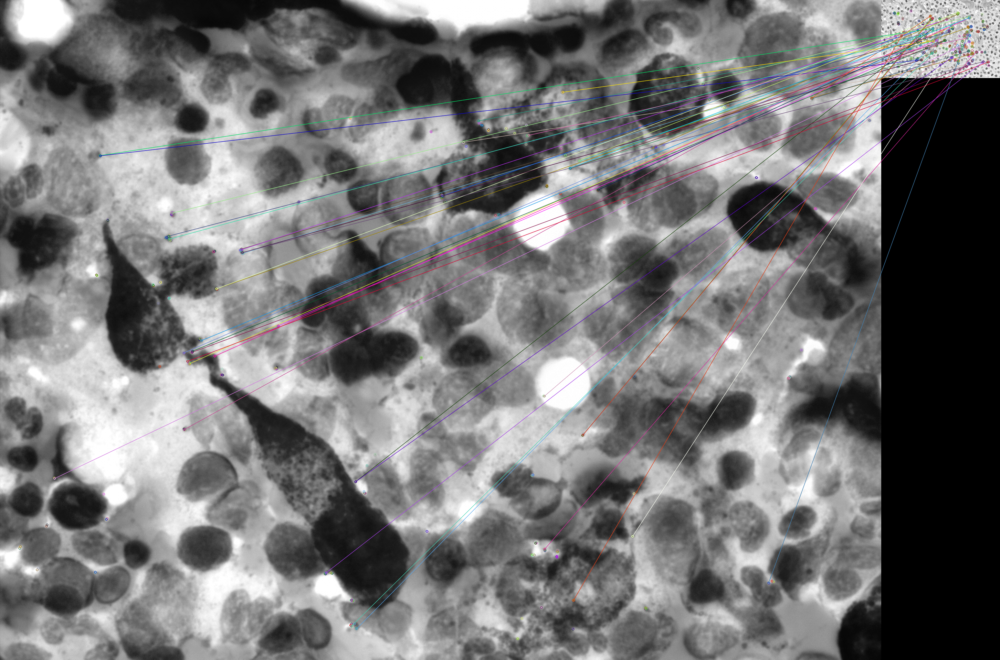

-1

In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg', 0)
img2 = cv2.imread('/content/drive/MyDrive/Bigdata Image Analysis/Images/00fd5462-0922-4e95-a455-1b0fc9835810.png', 0)

orb = cv2.ORB_create(nfeatures=500)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# matcher takes normType, which is set to cv2.NORM_L2 for SIFT and SURF, cv2.NORM_HAMMING for ORB, FAST and BRIEF
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)
# draw first 50 matches
match_img = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None)
cv2_imshow(match_img)
cv2.waitKey()

# Hough Transform

In [ ]:
img = cv.imread("/content/drive/MyDrive/Bigdata Image Analysis/Professor images/Aufnahme-160449-0013.jpg")
img = cv.medianBlur(img,5)

gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

circles = cv2.HoughCircles(gray_img,cv2.HOUGH_GRADIENT,1,20,param1=13,param2=2,minRadius=1,maxRadius=200)

if circles is not None: 

    circles = np.round(circles[0, :]).astype("int")

for (x, y, r) in circles:
    cv2.circle(img, (x, y), r, (0, 255, 0), 2)
    cv2.rectangle(img, (x - 2, y - 2),(x + 2, y + 2),(0, 128, 255),-1)
    Cell_count.append(r)
    x_count.append(x)
    y_count.append(y)

cv.imshow("gray", img) 
cv.waitKey(0)

print(len(Cell_count)) 